In [1]:
import tensorflow as tf
import sys

sys.path.append('../')

from Afterthought.Objective import Objective
from Afterthought.Transformation import *
from Afterthought.Regularizer import *
from Afterthought.Optimizer import *
from Afterthought.Miscellaneous import *
from Afterthought.Attribution import *
from Afterthought.Wrapper import *

print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))

2.10.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Model selection

In [2]:
# Model names: https://keras.io/api/applications/

model = Wrapper(model = 'InceptionV3')

print(model.layers())

['input_1', 'conv2d', 'batch_normalization', 'activation', 'conv2d_1', 'batch_normalization_1', 'activation_1', 'conv2d_2', 'batch_normalization_2', 'activation_2', 'max_pooling2d', 'conv2d_3', 'batch_normalization_3', 'activation_3', 'conv2d_4', 'batch_normalization_4', 'activation_4', 'max_pooling2d_1', 'conv2d_8', 'batch_normalization_8', 'activation_8', 'conv2d_6', 'conv2d_9', 'batch_normalization_6', 'batch_normalization_9', 'activation_6', 'activation_9', 'average_pooling2d', 'conv2d_5', 'conv2d_7', 'conv2d_10', 'conv2d_11', 'batch_normalization_5', 'batch_normalization_7', 'batch_normalization_10', 'batch_normalization_11', 'activation_5', 'activation_7', 'activation_10', 'activation_11', 'mixed0', 'conv2d_15', 'batch_normalization_15', 'activation_15', 'conv2d_13', 'conv2d_16', 'batch_normalization_13', 'batch_normalization_16', 'activation_13', 'activation_16', 'average_pooling2d_1', 'conv2d_12', 'conv2d_14', 'conv2d_17', 'conv2d_18', 'batch_normalization_12', 'batch_normaliza

# Activation atlas

### Directions

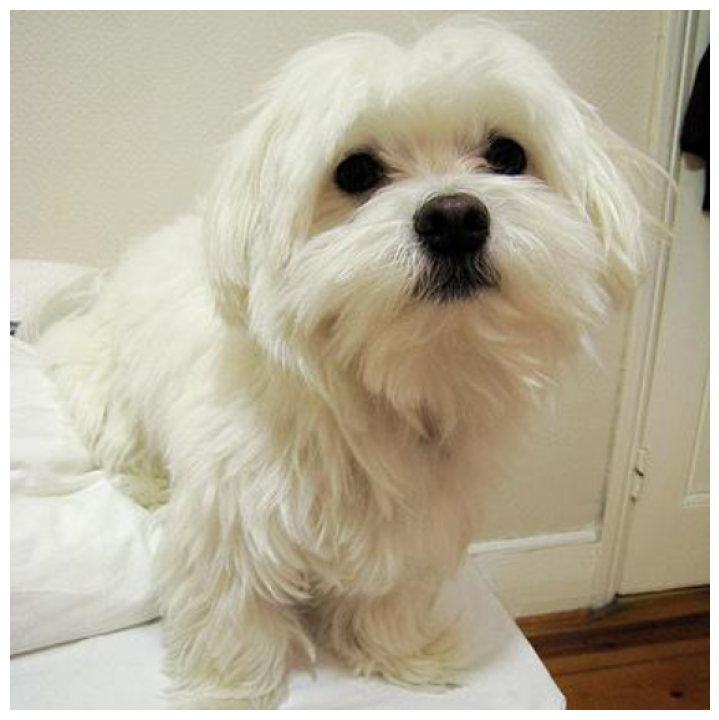

In [15]:
# Image path for model directions 
# (more details on direction at the objectives tutorial)
path = '../Afterthought/imagenet-examples/n02085936_Maltese_dog.jpg'

image = load_image((1, 512, 512, 3), path)

plot_all([image], False)

### Activation atlas algorithm

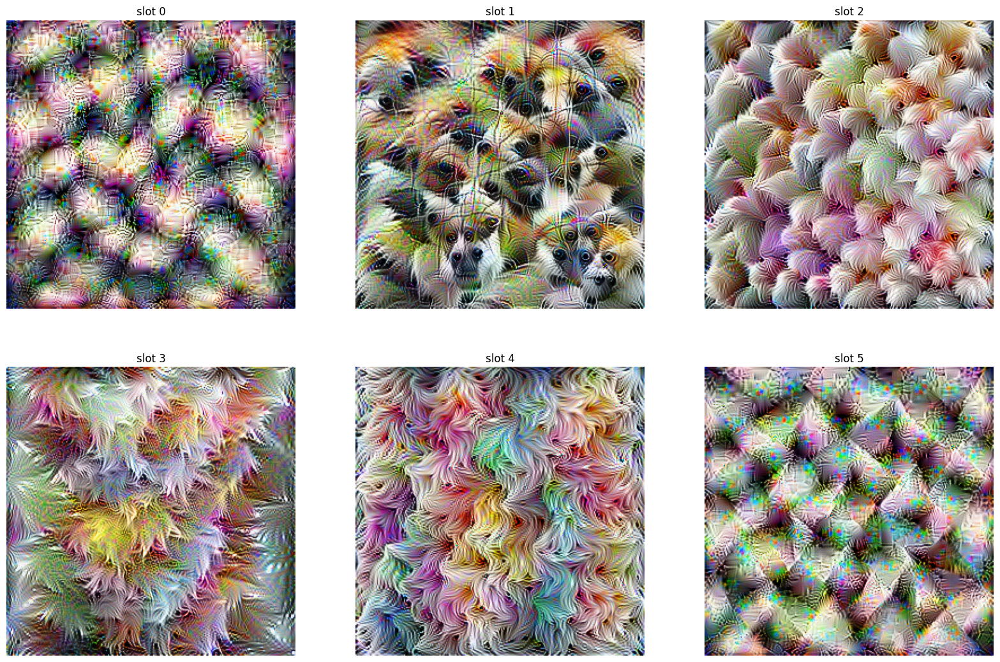

In [16]:
# Layer name
layer = 'mixed5'

# takes two long - just 1 sample for each one of the 6 batches
images = run_activation_atlas(path, model, layer,
                              batches = 6, samples = 1,
                              steps = 1000, image_shape = 256,
                              verbose = False)

plot_all(images)

# Activation layer

### Directions

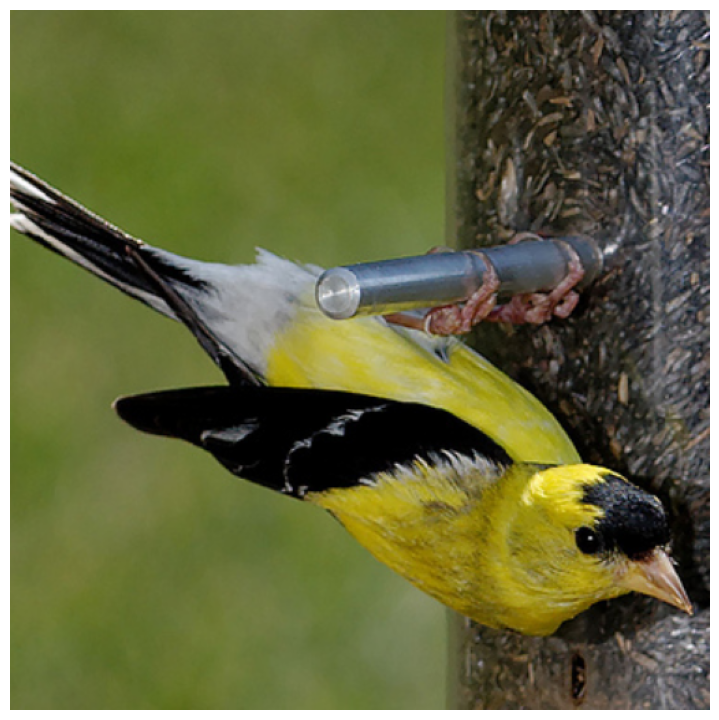

In [12]:
# Image path for model directions 
# (more details on direction at the objectives tutorial)
path = '../Afterthought/imagenet-examples/n01531178_goldfinch.jpg'

image = load_image((1, 512, 512, 3), path)

plot_all([image], False)

### Layers

In [14]:
layers_alias = 'mixed'
layers = []

for l in model.layers():
    if layers_alias in l:
        layers.append(l)

print(layers)

['mixed0', 'mixed1', 'mixed2', 'mixed3', 'mixed4', 'mixed5', 'mixed6', 'mixed7', 'mixed8', 'mixed9_0', 'mixed9', 'mixed9_1', 'mixed10']


### Activation layers algorithm

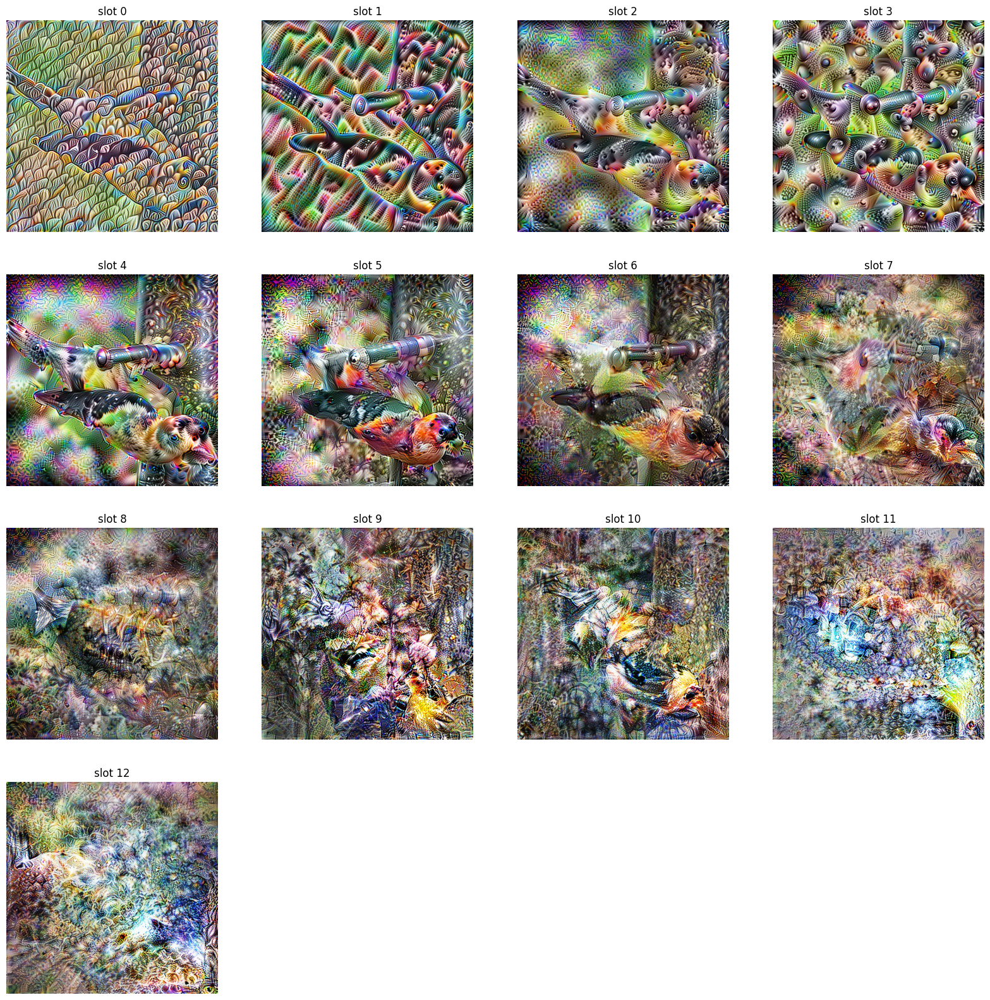

In [ ]:
images = run_activation_layer(path, model, layers,
                              steps = 500, verbose = False)

plot_all(images)

# Style Transfer

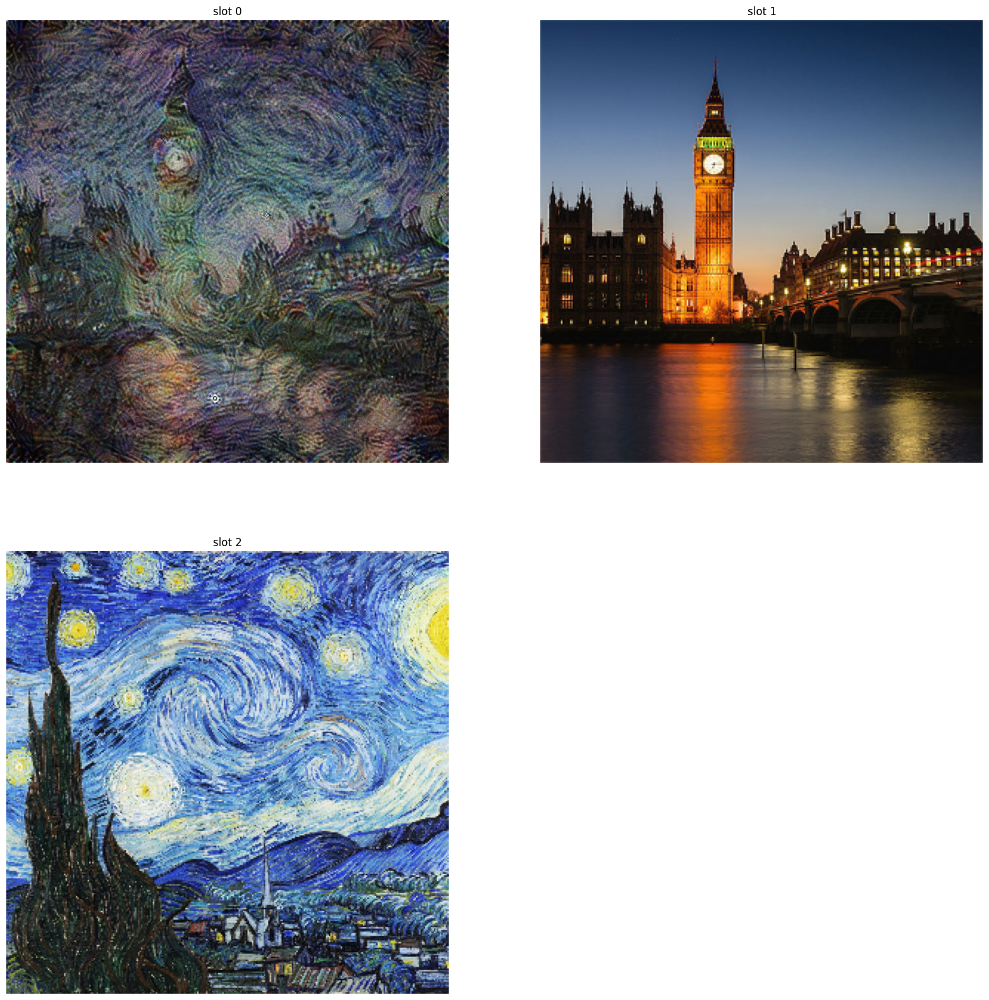

In [45]:
original = '../Afterthought/imagenet-examples/london.png'
style = '../Afterthought/imagenet-examples/neural_style_transfer_5_1.jpg'

layers = ['mixed3'] 

style_layers = ['mixed5',
                'mixed7', 
                'mixed9']


images = run_style_transfer(original, style, model,
                            layers, style_layers,
                            power = 1,
                            style_power = 500,
                            steps = 1000, 
                            verbose = False)

plot_all(images)

# Attribution

### Image in analisys

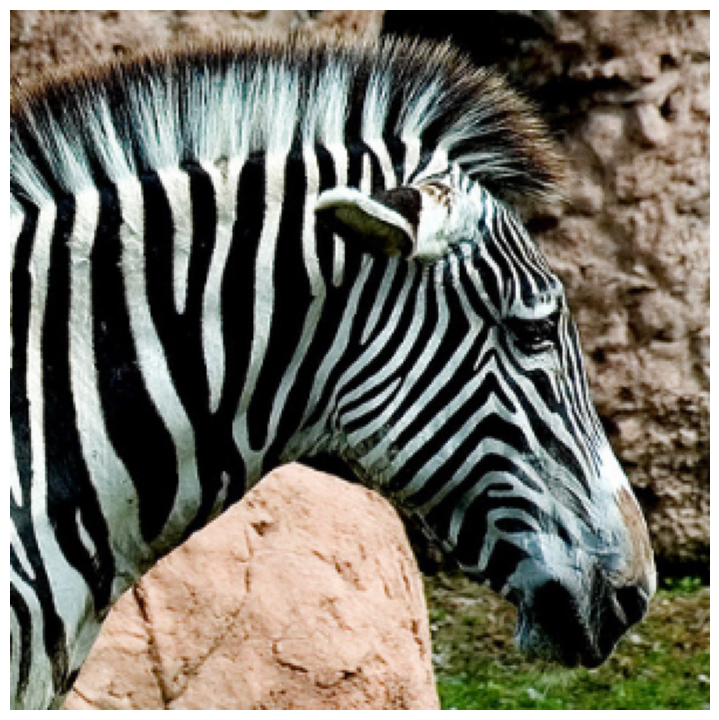

In [19]:
path = '../Afterthought/imagenet-examples/n02391049_zebra.jpg'

image = load_image(model.get_input_shape(), path)

plot_all([image], False)

### Attribution algorithm

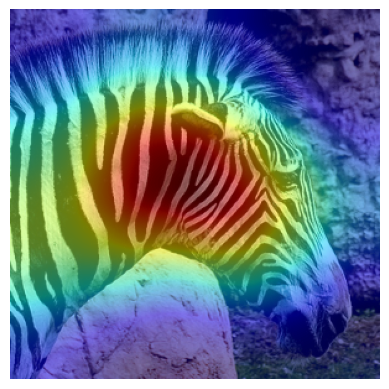

In [5]:
attribution = GradientCAM(model)

# predictions index from the image - zebra class
label = np.argmax(model.predict(image))

explanation = attribution.explainer(image, [tf.keras.utils.to_categorical(label, 1000)])

plot_attribution(explanation[0], image[0])

# MACO

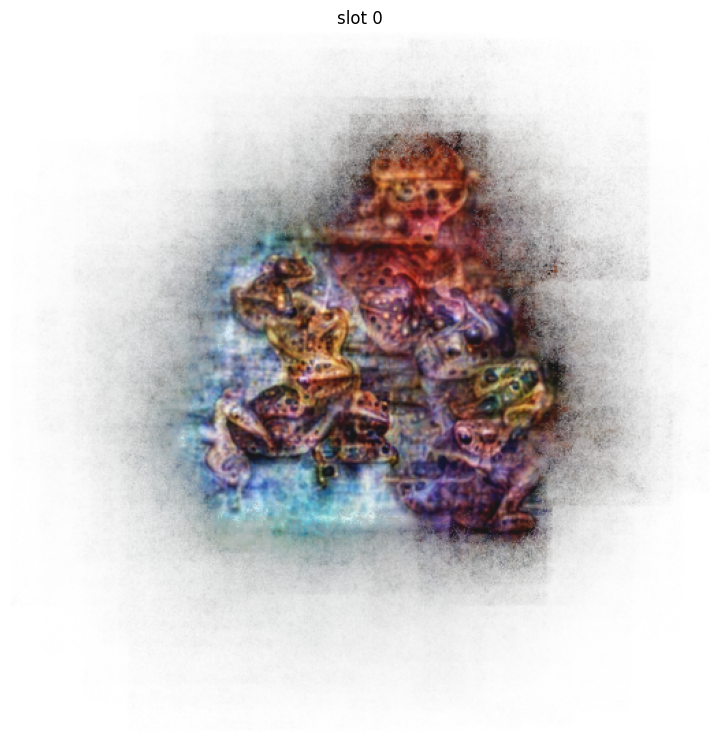

In [40]:
# Layer name
layer = -1

# Check activation maximization tutorial for more details
objective = Objective.channel(model = model, 
                              layer = layer,
                              channels = 32) # tailed frog

image, alpha = run_maco(objective = objective, spectrum_path = '../Afterthought/imagenet_decorrelated.npy',
                        steps = 1000, std = 0.1, box_size = None, crops = 16, verbose = False)

plot_all_maco([image[0]], [alpha[0]])